In [1]:
"""
Created on Wed Jan 10 17:13:16 2024
@author: Wu Yuxuan
"""

import os
import warnings

import pandas as pd
import scanpy as sc
import anndata as ad
import seaborn as sns
from matplotlib import rc_context
from matplotlib import pyplot as plt

/tmp/ipykernel_70818/1399816899.py:9: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
seed = 123
warnings.simplefilter(action='ignore', category=FutureWarning)
# info
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

-----
anndata     0.10.5.post1
scanpy      0.1.dev3254+g5b9bc72
-----
PIL                 10.2.0
asttokens           NA
comm                0.2.1
cycler              0.12.1
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.7
decorator           5.1.1
executing           2.0.1
h5py                3.10.0
igraph              0.11.3
ipykernel           6.29.0
jedi                0.19.1
joblib              1.3.2
kiwisolver          1.4.5
leidenalg           0.10.2
llvmlite            0.41.1
matplotlib          3.8.3
mpl_toolkits        NA
natsort             8.4.0
numba               0.58.1
numpy               1.26.4
packaging           23.2
pandas              2.2.0
parso               0.8.3
patsy               0.5.6
pexpect             4.9.0
pickleshare         0.7.5
pkg_resources       NA
platformdirs        4.1.0
prompt_toolkit      3.0.42
psutil              5.9.0
ptyprocess          0.7.0
pure_eval           0.2.2
pydev_ipython       NA
pydevconsole        NA
py

### 00.read data

In [3]:
os.chdir('/home/wu/datb1/reseq_ppp')

adata_all = ad.read_h5ad('processed_data/ALL_PPP_10X.h5ad')
adata_all_raw = ad.read_h5ad('processed_data/ALL_PPP_10X_raw.h5ad')

adata_ker = adata_all_raw[adata_all.obs['leiden'].str.contains('Keratinocyte')].copy()

del adata_all
del adata_all_raw

def extract_batch_group(batch):
    if batch.split('_')[0] == 'PPP':
        return 'Lesion'
    elif batch.split('_')[0] == 'HC':
        return 'HC'
    elif batch.split('_')[0] == 'PPPC':
        return 'NL'
    else:
        assert False, "Unknown batch group"

# extract specimen origin from batch
def extract_batch_origin(batch):
    if "palm" in batch:
        return 'palm'
    elif "foot" in batch:
        return 'foot'
    else:
        return 'unknown'

adata_ker.obs['batch_origin'] = adata_ker.obs.batch.apply(extract_batch_origin).astype('category')   
adata_ker.obs['batch_group'] = adata_ker.obs.batch.apply(extract_batch_group).astype('category')
adata_ker.obs['Meta'] = adata_ker.obs['batch_group'].apply(lambda x: 'Lesion' if x == 'Lesion' else 'Control').astype('category')
adata_ker.obs['is_P36'] = adata_ker.obs.batch.str.contains("P36").astype('category')
adata_ker.obs['is_C02_palm'] = adata_ker.obs.batch.str.contains("C02_palm").astype('category')
adata_ker.obs['is_C02_foot'] = adata_ker.obs.batch.str.contains("C02_foot").astype('category')
adata_ker.obs['is_P40'] = adata_ker.obs.batch.str.contains("P40").astype('category')
adata_ker.obs['is_P29'] = adata_ker.obs.batch.str.contains("P29").astype('category')
adata_ker.obs['is_P23'] = adata_ker.obs.batch.str.contains("P23").astype('category')

In [4]:
adata_ker

AnnData object with n_obs × n_vars = 26935 × 18704
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'batch_origin', 'batch_group', 'Meta', 'is_P36', 'is_C02_palm', 'is_C02_foot', 'is_P40', 'is_P29', 'is_P23'
    var: 'n_cells', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'batch', 'batch_colors', 'batch_raw'

### 01.normalization

In [5]:
adata_ker.layers['counts'] = adata_ker.X.copy()

sc.pp.normalize_total(adata_ker, target_sum=1e4)
sc.pp.log1p(adata_ker)

adata_ker.raw = adata_ker

normalizing counts per cell
    finished (0:00:00)


Standardizing Data across genes.

Found 16 batches

Found 0 numerical variables:
	

Found 43 genes with zero variance.
Fitting L/S model and finding priors

Finding parametric adjustments



/home/wu/scanpy/scanpy/preprocessing/_combat.py:340: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/wu/scanpy/scanpy/preprocessing/_combat.py:340: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


Adjusting data

regressing out ['total_counts', 'pct_counts_mt']
    finished (0:01:38)
extracting highly variable genes


/home/wu/scanpy/scanpy/preprocessing/_highly_variable_genes.py:212: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


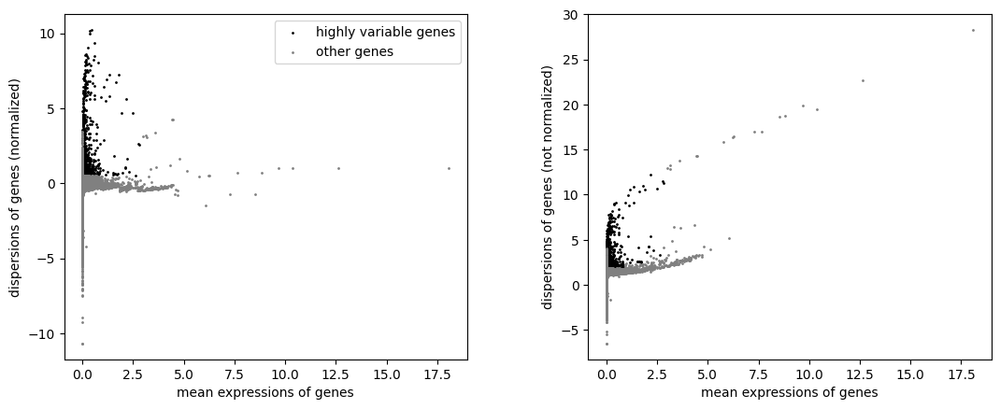

In [6]:
sc.pp.combat(adata_ker, key='batch')

sc.pp.regress_out(adata_ker, ['total_counts', 'pct_counts_mt'], n_jobs=4, add_intercept=True)

sc.pp.highly_variable_genes(adata_ker, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata_ker)

sc.pp.scale(adata_ker, max_value=10)

In [7]:
adata_ker.var['highly_variable'].sum()

1915

### 02.pca and demension reducing

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:19)


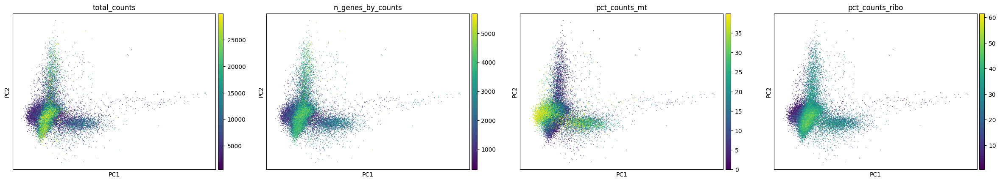

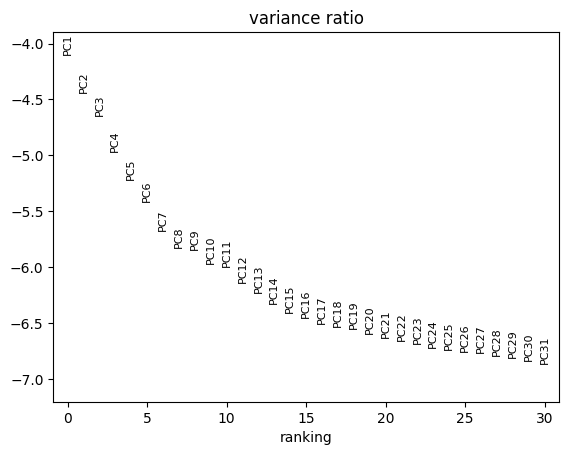

In [8]:
sc.tl.pca(adata_ker, svd_solver='arpack', random_state=seed)
sc.pl.pca(adata_ker, color=['total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'pct_counts_ribo'])

sc.pl.pca_variance_ratio(adata_ker, log=True)

In [9]:
# # Copy adata not to modify UMAP in the original adata object
# adata_temp=adata_ker.copy()
# # Loop through different umap parameters, recomputting and replotting UMAP for each of them
# for min_dist in [0.1,0.5,1,2]:
#     for spread in [0.5,1,2,5]:
#         param_str=' '.join(['min_dist =',str(min_dist),'and spread =',str(spread)])
#         sc.tl.umap(adata_temp, min_dist=min_dist, spread=spread)
#         # Display plot and then immediately close it to ensure that
#         # we do not open too many plot windows at once
#         g=sc.pl.umap(adata_temp,title=param_str,s=40,color='leiden',
#                    show=False, return_fig=True)
#         display(g)
#         plt.close()
# del adata_temp

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:17)
computing neighbors
    using 'X_pca' with n_pcs = 30


/home/wu/mambaforge/envs/github_scanpy/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:21)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


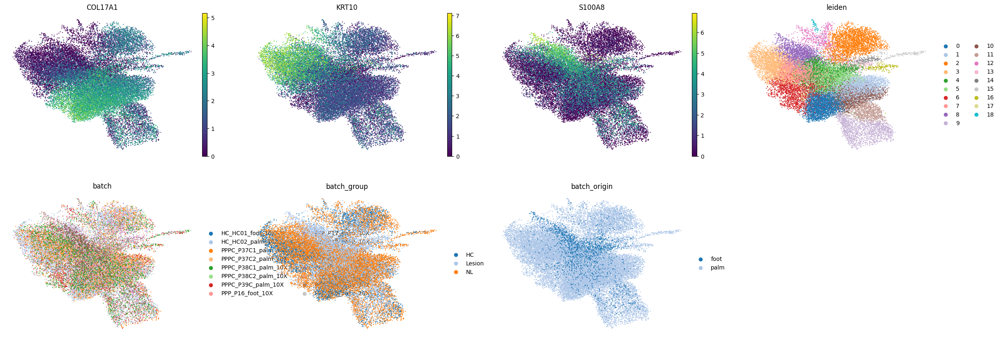

In [10]:
sc.tl.pca(adata_ker, svd_solver='arpack', random_state=seed)
# sc.pl.pca(adata_ker, color=['total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'pct_counts_ribo'])

# sc.pl.pca_variance_ratio(adata_ker, log=True)

sc.pp.neighbors(adata_ker, n_neighbors=10, n_pcs=30, random_state=seed)

sc.tl.umap(adata_ker, random_state=seed, min_dist=0.5, spread=0.5)
# sc.pl.umap(adata_ker)

sc.tl.leiden(adata_ker, resolution=1, random_state=seed)
sc.pl.umap(adata_ker, color=['COL17A1', 'KRT10', 'S100A8', 'leiden', 'batch', 'batch_group', 'batch_origin'], size=10, frameon=False, ncols=4, palette=sns.palettes.color_palette('tab20'))

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


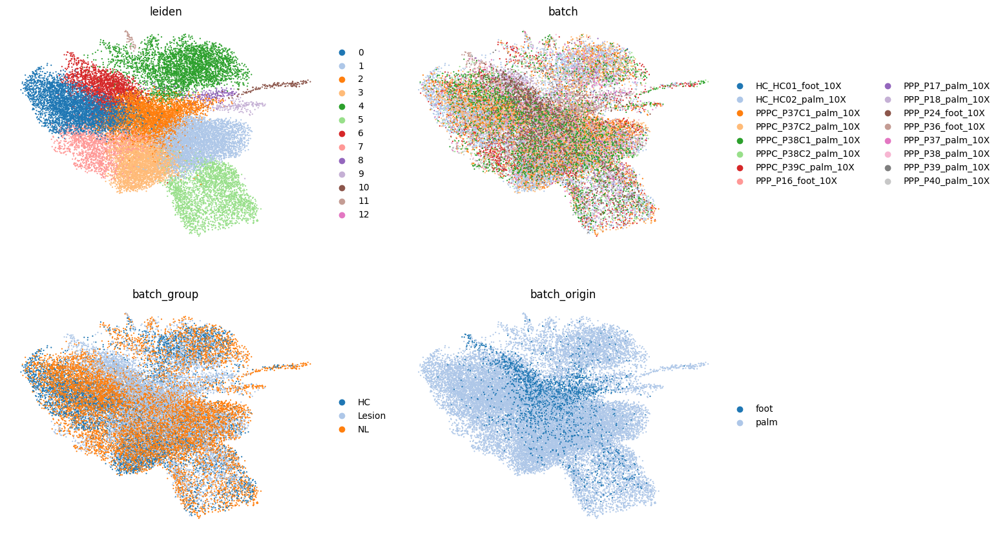

In [11]:
sc.tl.leiden(adata_ker, resolution=0.5, random_state=seed)
sc.pl.umap(adata_ker, color=['leiden', 'batch', 'batch_group', 'batch_origin'], size=10, frameon=False, ncols=2, palette=sns.palettes.color_palette('tab20'))

/home/wu/scanpy/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


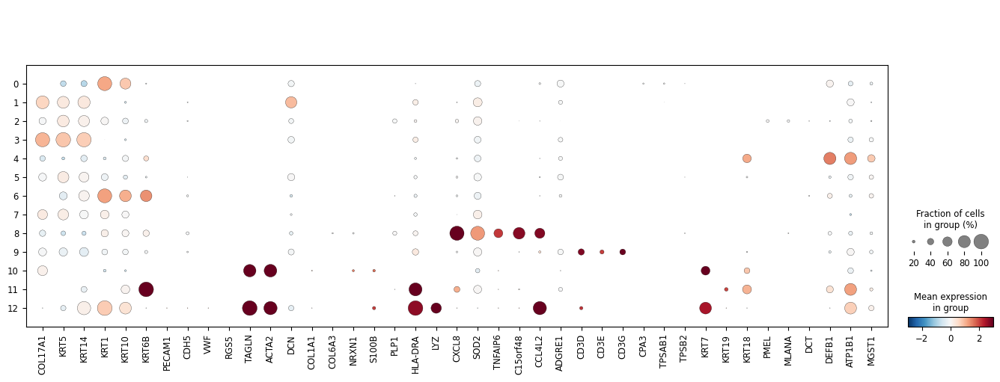

In [12]:
marker_genes = ["COL17A1", "KRT5", "KRT14", "KRT1", "KRT10", "KRT6B", "PECAM1","CDH5","VWF","RGS5","TAGLN","ACTA2","DCN","COL1A1","COL6A3",
             "NRXN1","S100B","PLP1","HLA-DRA", "LYZ", "CXCL8", "SOD2", "TNFAIP6", "C15orf48","CCL4L2","ADGRE1",
             "CD3D","CD3E","CD3G","CPA3","TPSAB1","TPSB2","KRT7","KRT19","KRT18","PMEL", "MLANA", "DCT", "DEFB1", "ATP1B1", "MGST1"]

with rc_context({'figure.figsize': (8, 7)}):
    sc.pl.dotplot(adata_ker, marker_genes, groupby='leiden', show=False, use_raw=False, dot_max=1, dot_min=0.1, color_map='RdBu_r', vmax=3, vmin=-3)


/home/wu/scanpy/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


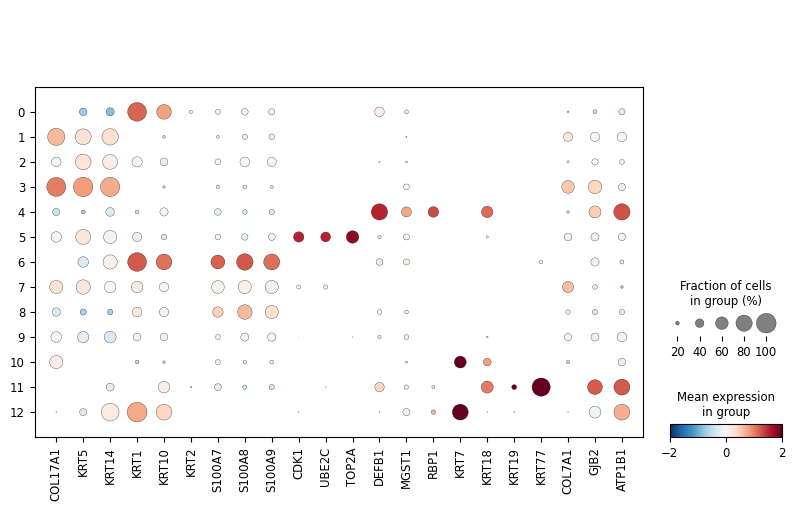

In [13]:
new_marker_genes = ['COL17A1', 'KRT5', 'KRT14', 'KRT1', 'KRT10', 'KRT2', 
                    'S100A7', 'S100A8', 'S100A9', 'CDK1', 'UBE2C', 'TOP2A', 'DEFB1', 'MGST1', 'RBP1',
                    'KRT7', 'KRT18', 'KRT19', 'KRT77', 'COL7A1', 'GJB2', 'ATP1B1']

with rc_context({'figure.figsize': (8, 7)}):
    sc.pl.dotplot(adata_ker, new_marker_genes, groupby='leiden', show=False, use_raw=False, dot_max=1, dot_min=0.1, color_map='RdBu_r', vmax=2, vmin=-2)
    # plt.savefig('fig2/dot_kc_marker_genes.pdf', bbox_inches="tight")

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


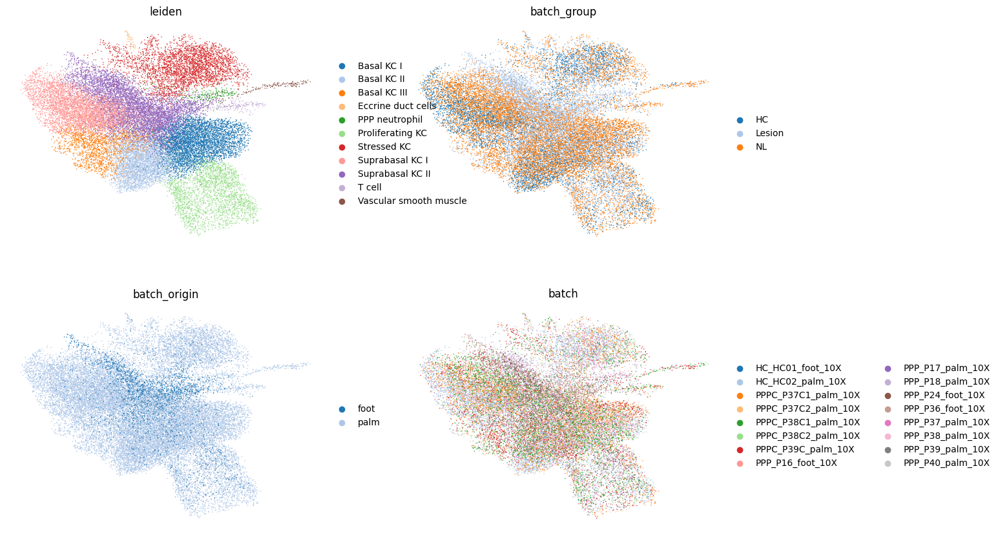

/home/wu/scanpy/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


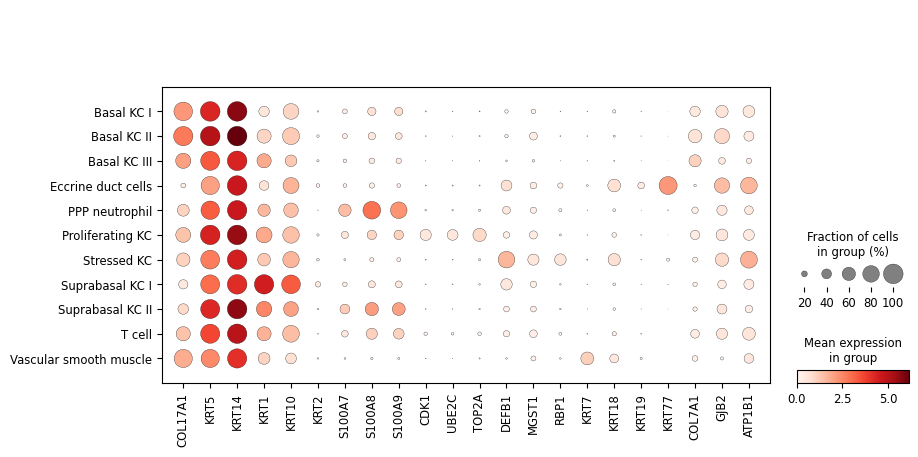

In [14]:
new_cluster_names = {
    '0': 'Suprabasal KC I',
    '1': 'Basal KC I',
    '2': 'Suprabasal KC II',
    '3': 'Basal KC II',
    '4': 'Stressed KC',
    '5': 'Proliferating KC',
    '6': 'Suprabasal KC II',
    '7': 'Basal KC III',
    '8': 'PPP neutrophil',
    '9': 'T cell',
    '10': 'Vascular smooth muscle',
    '11': 'Eccrine duct cells',
    '12': 'Vascular smooth muscle',
}

adata_ker.obs['leiden'] = adata_ker.obs['leiden'].map(new_cluster_names).astype('category')
sc.pl.umap(adata_ker, color=['leiden', 'batch_group', 'batch_origin', 'batch'], ncols=2, frameon=False)
sc.pl.dotplot(adata_ker, new_marker_genes, groupby='leiden')

In [15]:
# drop cells with non ker cluster
adata_ker = adata_ker[~adata_ker.obs['leiden'].isin(['T cell', 'PPP neutrophil', \
                    'Vascular smooth muscle', 'Eccrine duct cells'])].copy()

### re-group using only keratinocytes

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)


/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


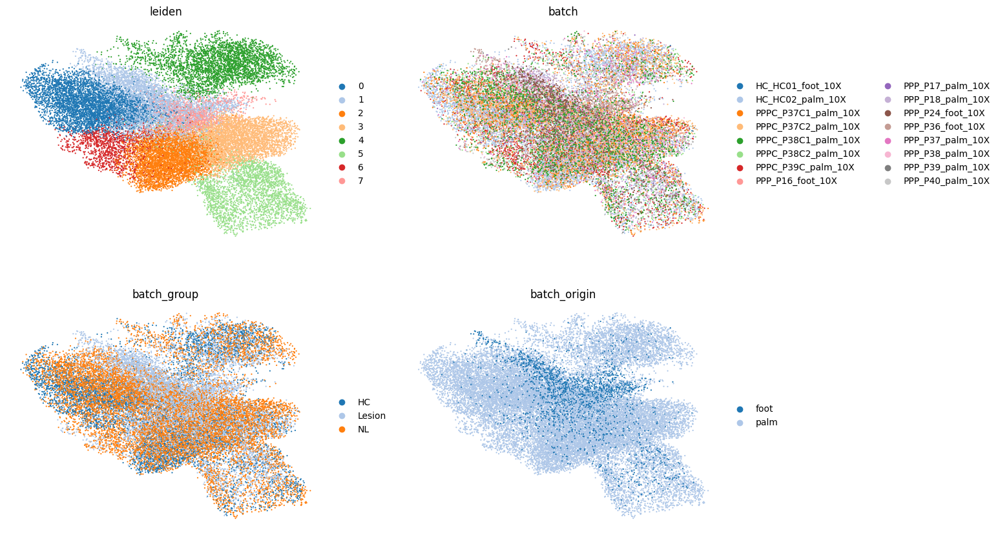

In [16]:
sc.tl.leiden(adata_ker, resolution=0.5, random_state=seed)
sc.pl.umap(adata_ker, color=['leiden', 'batch', 'batch_group', 'batch_origin'], size=10, frameon=False, ncols=2, palette=sns.palettes.color_palette('tab20'))

/home/wu/scanpy/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


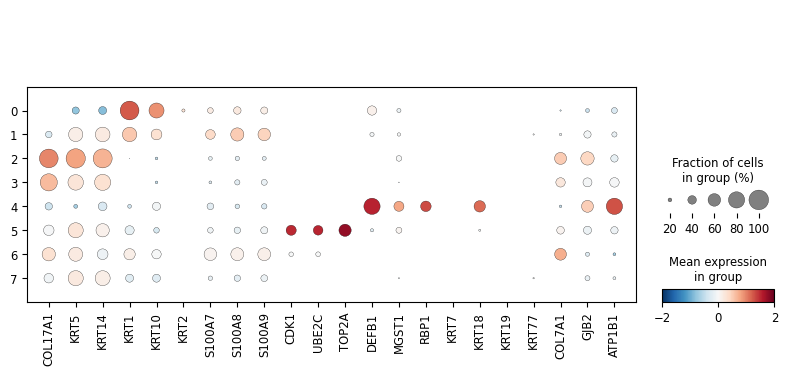

In [17]:
new_marker_genes = ['COL17A1', 'KRT5', 'KRT14', 'KRT1', 'KRT10', 'KRT2', 
                    'S100A7', 'S100A8', 'S100A9', 'CDK1', 'UBE2C', 'TOP2A', 'DEFB1', 'MGST1', 'RBP1',
                    'KRT7', 'KRT18', 'KRT19', 'KRT77', 'COL7A1', 'GJB2', 'ATP1B1']

with rc_context({'figure.figsize': (8, 7)}):
    sc.pl.dotplot(adata_ker, new_marker_genes, groupby='leiden', show=False, use_raw=False, dot_max=1, dot_min=0.1, color_map='RdBu_r', vmax=2, vmin=-2)
    # plt.savefig('fig2/dot_kc_marker_genes.pdf', bbox_inches="tight")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


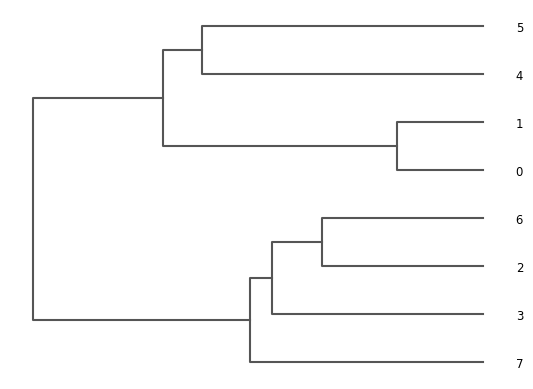

<Axes: >

In [18]:
sc.tl.dendrogram(adata_ker, groupby='leiden')
sc.pl.dendrogram(adata_ker, groupby='leiden', orientation='left')

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


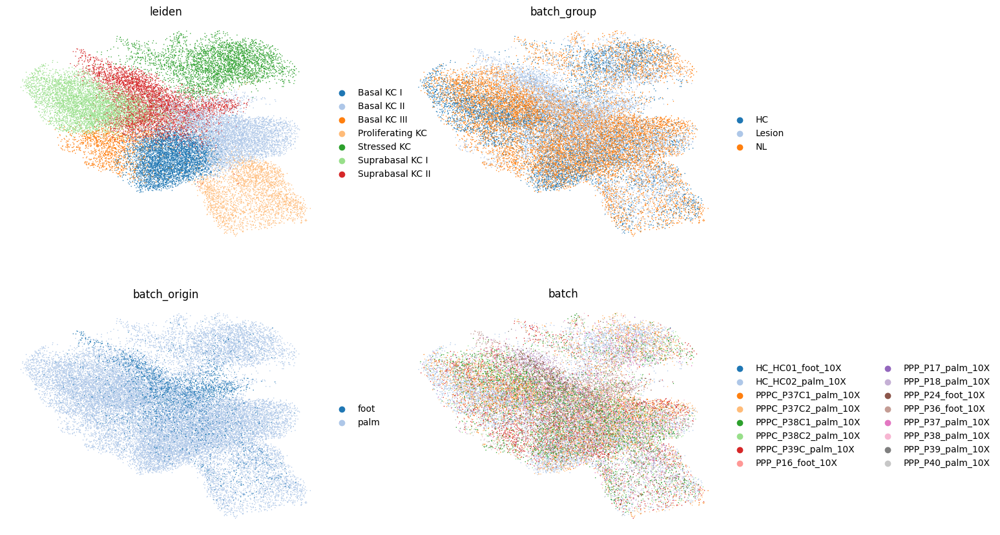

/home/wu/scanpy/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


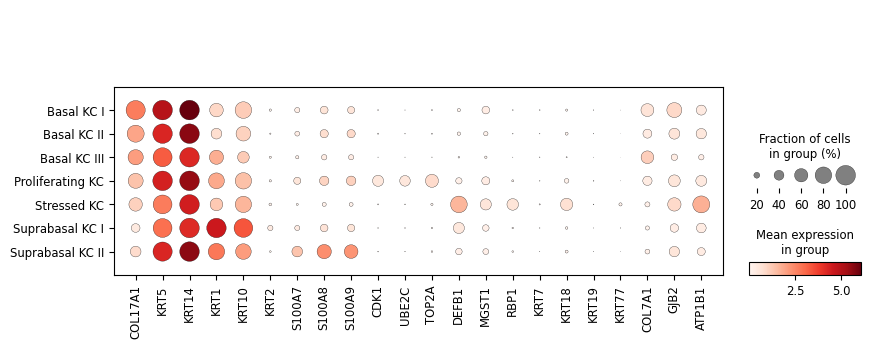

In [19]:
new_cluster_names = {
    '0': 'Suprabasal KC I',
    '1': 'Suprabasal KC II',
    '2': 'Basal KC I',
    '3': 'Basal KC II',
    '4': 'Stressed KC',
    '5': 'Proliferating KC',
    '6': 'Basal KC III',
    '7': 'Basal KC II'
}

adata_ker.obs['leiden'] = adata_ker.obs['leiden'].map(new_cluster_names).astype('category')
sc.pl.umap(adata_ker, color=['leiden', 'batch_group', 'batch_origin', 'batch'], ncols=2, frameon=False)
sc.pl.dotplot(adata_ker, new_marker_genes, groupby='leiden')

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    643 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    727 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


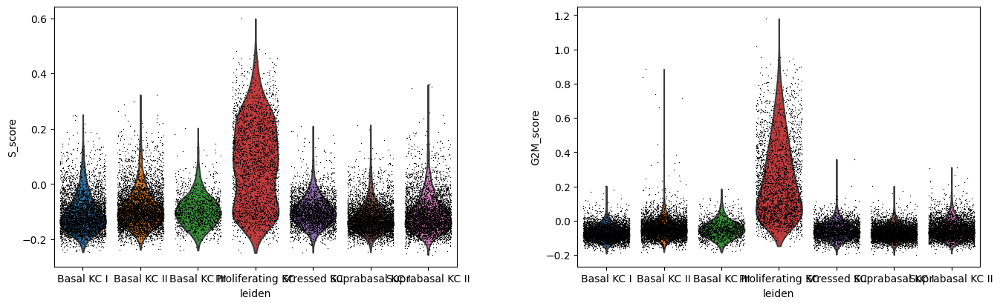

In [20]:
cc_genes = "MCM5,PCNA,TYMS,FEN1,MCM2,MCM4,RRM1,UNG,GINS2,MCM6,CDCA7,DTL,PRIM1,UHRF1,MLF1IP,HELLS,RFC2,RPA2,NASP,RAD51AP1,GMNN,WDR76,SLBP,CCNE2,UBR7,POLD3,MSH2,ATAD2,RAD51,RRM2,CDC45,CDC6,EXO1,TIPIN,DSCC1,BLM,CASP8AP2,USP1,CLSPN,POLA1,CHAF1B,BRIP1,E2F8,HMGB2,CDK1,NUSAP1,UBE2C,BIRC5,TPX2,TOP2A,NDC80,CKS2,NUF2,CKS1B,MKI67,TMPO,CENPF,TACC3,FAM64A,SMC4,CCNB2,CKAP2L,CKAP2,AURKB,BUB1,KIF11,ANP32E,TUBB4B,GTSE1,KIF20B,HJURP,CDCA3,HN1,CDC20,TTK,CDC25C,KIF2C,RANGAP1,NCAPD2,DLGAP5,CDCA2,CDCA8,ECT2,KIF23,HMMR,AURKA,PSRC1,ANLN,LBR,CKAP5,CENPE,CTCF,NEK2,G2E3,GAS2L3,CBX5,CENPA"
cc_genes = cc_genes.split(',')

s_genes = cc_genes[:43]
g2m_genes = cc_genes[43:]

sc.tl.score_genes_cell_cycle(adata_ker, s_genes=s_genes, g2m_genes=g2m_genes)
sc.pl.violin(adata_ker, ['S_score', 'G2M_score'], jitter=0.4, groupby = 'leiden')

/home/wu/scanpy/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


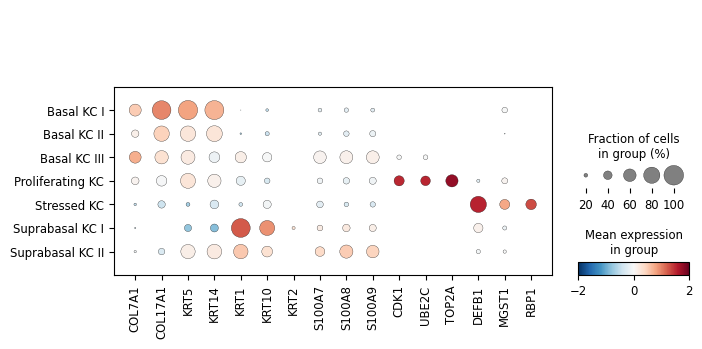

In [21]:
new_marker_genes = ['COL7A1', 'COL17A1', 'KRT5', 'KRT14', 'KRT1', 'KRT10', 'KRT2', 
                    'S100A7', 'S100A8', 'S100A9', 'CDK1', 'UBE2C', 'TOP2A', 'DEFB1', 'MGST1', 'RBP1',
                    ]

with rc_context({'figure.figsize': (8, 7)}):
    sc.pl.dotplot(adata_ker, new_marker_genes, groupby='leiden', show=False, use_raw=False, dot_max=1, dot_min=0.1, color_map='RdBu_r', vmax=2, vmin=-2)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


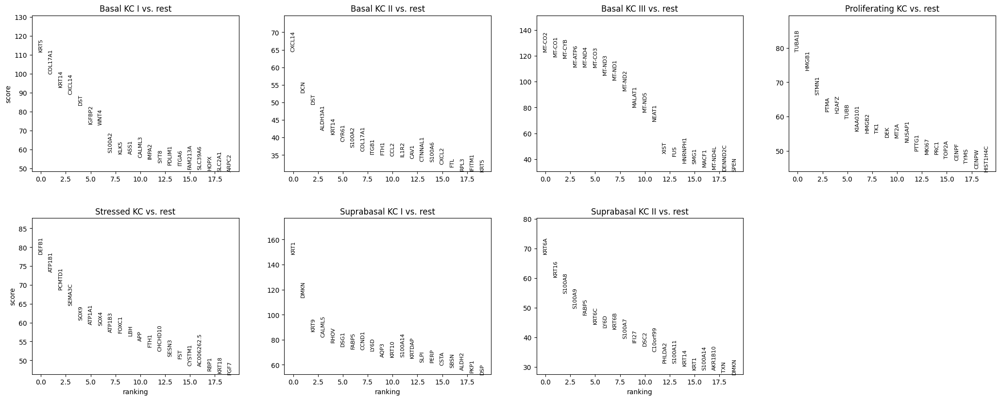

In [22]:
sc.tl.rank_genes_groups(adata_ker, 'leiden', method='t-test', use_raw=True, n_genes=20, tie_correct=True)
sc.pl.rank_genes_groups(adata_ker, n_genes=20, sharey=False)

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


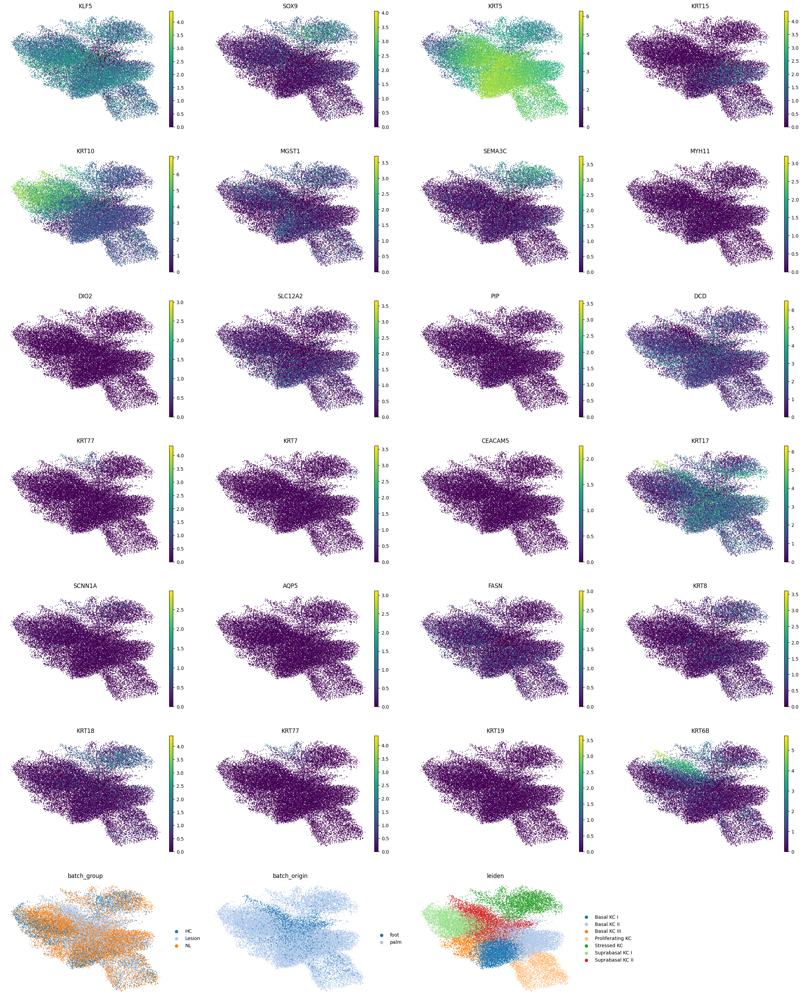

In [23]:
# sc.tl.leiden(adata_ker, resolution=0.5, random_state=seed)
sc.pl.umap(adata_ker, color=['KLF5', 'SOX9', 'KRT5', 'KRT15', 'KRT10', 'MGST1', 'SEMA3C', 'MYH11', 'DIO2', 'SLC12A2', 'PIP', 'DCD', 'KRT77', 'KRT7', 'CEACAM5','KRT17', 'SCNN1A', 'AQP5', 'FASN', 'KRT8', 'KRT18', 'KRT77', 'KRT19', 'KRT6B', 'batch_group', 'batch_origin', 'leiden'], size=10, frameon=False, ncols=4, palette=sns.palettes.color_palette('tab20'))

In [24]:
# save data
adata_ker.write_h5ad('processed_data/KC_PPP_10X.h5ad')